# **Telecom Churn Prediction with Decision Tree**

In [ ]:
# Load libraries
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [ ]:
# load dataset
pima = pd.read_csv("Telco-Customer-Churn.csv")

# 1.Convert String values into meaningful Integers

In [ ]:
pima["Contract"]= pima["Contract"].map({"Month-to-month": 0, "One year": 1, "Two year":2})
pima["InternetService"]= pima["InternetService"].map({"Fiber optic":1,"No" : 0, "DSL":2})
pima["TechSupport"]= pima["TechSupport"].map({"No" : 0, "Yes":1, "No internet service":0})
pima["OnlineSecurity"]= pima["OnlineSecurity"].map({"No" : 0, "Yes":1,"No internet service":0})
pima["PaperlessBilling"]= pima["PaperlessBilling"].map({"No" : 0, "Yes":1})
pima["PaymentMethod"]= pima["PaymentMethod"].map({"Electronic check" : 0, "Mailed check":1,"Bank transfer (automatic)" : 2, "Credit card (automatic)":3})

In [ ]:
pima.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,2,0,...,No,0,No,No,0,1,0,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,2,1,...,Yes,0,No,No,1,0,1,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,2,1,...,No,0,No,No,0,1,1,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,2,1,...,Yes,1,No,No,1,0,2,42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,1,0,...,No,0,No,No,0,1,0,70.70,151.65,Yes


# 2.Define Features

In [ ]:
#split dataset in features and target variable
feature_cols = ['Contract', 'InternetService', 'TechSupport', 'OnlineSecurity','SeniorCitizen','PaperlessBilling','PaymentMethod']
X = pima[feature_cols] # Features
y = pima.Churn # Target variable

# 3.Seperate Training and Testing dataset

In [ ]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

# 4.Create and Train Decision Tree Classifier

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)


# 5.Check the accuracy

In [ ]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7893989588263133


# 6.Visualize the tree

In [ ]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('tree.png')
Image(graph.create_png())

# We can observe that Tree is very complex, let us try to optimise our tree, without affecting accuracy

Accuracy: 0.7950780880265026


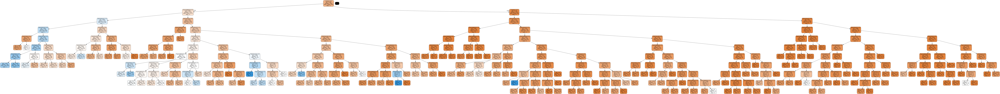

In [ ]:
#split dataset in features and target variable
feature_cols = ['Contract','SeniorCitizen','PaymentMethod', 'InternetService',  'OnlineSecurity', 'TechSupport']
X = pima[feature_cols] # Features
y = pima.Churn # Target variable

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('tree.png')
Image(graph.create_png())

# Here We can see that removing 'PaperlessBilling' as feature reduces our tree and also increases accuracy of DT by 0.005.

Accuracy: 0.7893989588263133


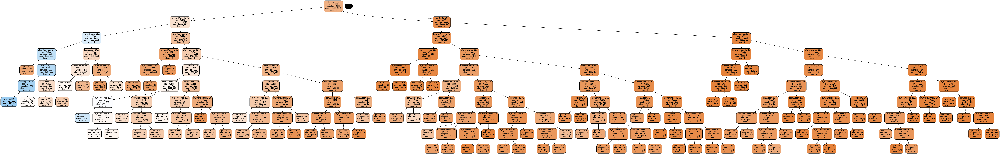

In [ ]:
#split dataset in features and target variable
feature_cols = ['Contract','PaymentMethod', 'InternetService',  'OnlineSecurity', 'TechSupport']
X = pima[feature_cols] # Features
y = pima.Churn # Target variable

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('tree.png')
Image(graph.create_png())

# Further Removing Senior Citizen as feature, we see that width of the tree is reduced significantly and accuracy is not affected that much.